In [73]:
using Plots: length
using Base: Float64, list_append!!
# Głowny program do wyliczania i wyśweitlania położenia ciał 

# Pakiety
using Plots, LinearAlgebra, Parameters, AstroLib

# Ważne stałe
Q = 14                    # pozwala używać Float64 zamiast BigFloat
G = 6.6732*10^(-11+2Q)     # stała grawitacji 
def_size = 8.0              # domyślna wielkość wyświetlana na animacji

# Typ planeta
@with_kw mutable struct My_planet
    name::String
    mass::Float64
    coord::Array{Float64,1}
    v_vec::Array{Float64,1}
    a_vec::Array{Float64,1} = [0, 0]
    size::Float64 = 6.0
    coords_list::Array{Array{Float64,1},1} = []
    v_vecs_list::Array{Float64,1} = []
    a_vecs_list::Array{Float64,1} = []
    every_frame_time::Int64 = 0
end


#---------------------------------------------------------------------------------------------
#       FUNKCJE DO OBLICZEŃ 
#---------------------------------------------------------------------------------------------

dist_vec(coord1::Array{Float64,1},coord2::Array{Float64,1}) = coord2 .- coord1
"""Wylicza wektor odległości z coord1 do coord2"""

F_gravity(M1::Float64,M2::Float64,r::Array) = (G/norm(r))*(M1/norm(r))*(M2/norm(r)).*r
"""Wylicza wektor siły grawitacji"""

function the_farthest(lista::Array{My_planet,1})
"""Podaj odległość najdalszej planety od środka układu"""
    return maximum(norm(x.coord) for x in lista) 
end

function Scale_size(planeta::My_planet, rel_mass::Float64, def_size = 6)
"""Zwróć przeskalowany rozmiar planety do wyświetlania"""
    return (planeta.mass/rel_mass)^(0.1)*def_size
end

function Scale_planets(lista::Array{My_planet,1})
"""Skaluj planety względem mediany"""
    mass_list = collect(m.mass for m in lista)
    rel_mass = median(mass_list)
    for i in lista
        i.size = Scale_size(i,rel_mass)
    end
end

function time_for_days(lista::Array{My_planet,1})
"""Przelicza i zwraca: Czas jednej klatki na dni oraz czas całej symulacji w dniach"""
    days = lista[1].every_frame_time/86400
    full_time = days * length(lista[1].v_vecs_list)
    days_list = collect(days:days:full_time)
    return days_list, full_time  
end

function MainFunction(lista::Array{My_planet,1},T::Int64)
"""Zmień położenie planety o podaną jednostkę czasu
===================================================
lista - listę obiektów typu My_planet
T - czas w sekundach po jakim przeliczy nową pozycję"""

    for i in eachindex(lista)
        FG=[0.0, 0.0]
        for j in eachindex(lista)
            if j != i
                r = dist_vec(lista[i].coord, lista[j].coord)
                F = F_gravity(lista[i].mass, lista[j].mass, r)
                FG += F
            end
        end
        lista[i].a_vec = FG./lista[i].mass.*(0.1^Q)      # ustawia wektor przyspieszenia planety 
    end
    for i in eachindex(lista)
        lista[i].v_vec += T.*lista[i].a_vec
        lista[i].coord += T.*lista[i].v_vec  
    end
end

function Set_coord_list(planets_list::Array{My_planet,1}, frames::Int64, delta_time::Int64, conversion_number::Int64)
"""Zapisuje położenie, prędkość, przyspiesznie oraz czas przejścia 
do nowego położenia planet w ich atrybutach.
==================================================================
frames - zapisywana ilość klatek( położeń planety)
delta_time - czas w sekundach po jakim przeliczy nową pozycję
conversion_number - ilość przeliczeń na każdą zapisaną klatkę"""
    for i in planets_list
        i.every_frame_time = delta_time*conversion_number
    end

    for i in 1:frames
        for i in planets_list
            push!(i.coords_list, i.coord)
            push!(i.v_vecs_list, norm(i.v_vec))
            push!(i.a_vecs_list, norm(i.a_vec))
        end
        for i in 1:conversion_number
            MainFunction(planets_list,delta_time)
        end   
    end
end

function make_symulation1(planets_list::Array{My_planet,1}, scale::Bool=true)
"""Tworzy animację ruchu planet na podstawie zapisanych pozycji w atrybucie coords_list."""
    if scale == true
        Scale_planets(planets_list)
    end
    dist_limit = the_farthest(planets_list)*1.2
    symulation = @animate for i in 1:length(planets_list[1].coords_list)
        scatter([planets_list[1].coords_list[i][1]],[planets_list[1].coords_list[i][2]],markercolor = :yellow,
        xlim = (-dist_limit, dist_limit),
        ylim = (-dist_limit, dist_limit), 
        markersize = planets_list[1].size,
        label = planets_list[1].name)
        xlabel!("Distance [m]")
        ylabel!("Distance [m]")
        for j in 2:length(planets_list)
            scatter!([planets_list[j].coords_list[i][1]],[planets_list[j].coords_list[i][2]],
            markersize = planets_list[j].size,
            label = planets_list[j].name)
            end
    end
    return symulation
end

function make_symulation2(planets_list::Array{My_planet,1})
"""Tworzy animację bezwględnej prędkości planet w czasie"""
    days_list, full_time = time_for_days(planets_list)
    symulation = @animate for i in eachindex(planets_list[1].v_vecs_list)
        plot(days_list[1:i], planets_list[1].v_vecs_list[1:i],markercolor = :yellow,
        xlim = (0,full_time),
        label = planets_list[1].name)
        xlabel!("Time [day]")
        ylabel!("Speed [m/s]")
        for j in 2:length(planets_list)
            plot!(days_list[1:i], [planets_list[j].v_vecs_list[1:i]],
            label = planets_list[j].name)
        end
    end
    return symulation  
end

function make_symulation3(planets_list::Array{My_planet,1})
"""Tworzy animację bezględnego przyspieszenia planet w czasie"""
    days_list, full_time = time_for_days(planets_list)
    symulation = @animate for i in eachindex(planets_list[1].a_vecs_list)
        plot(days_list[1:i], planets_list[1].a_vecs_list[1:i],markercolor = :yellow,
        xlim = (0, full_time),
        label = planets_list[1].name)
        xlabel!("Time [day]")
        ylabel!("Acceleration [m/s^2]")
        for j in 2:length(planets_list)
            plot!(days_list[1:i], planets_list[j].a_vecs_list[1:i],
            label = planets_list[j].name)
        end
    end
    return symulation   
end


#-------------------------------------------------------------------------------------------
#               SYMULACJA
#-------------------------------------------------------------------------------------------

# PARAMETRY
frames = 1000
delta_time = 3000
conversion_number = 10
fps = 40

40

In [75]:
#--------------------------------------------------------------------------------------------
#       UKŁADY PLANETARNE 
#--------------------------------------------------------------------------------------------


Number_of_planets = 4


# Układ słoneczny ze Słońcem w centrum
Ziemia = My_planet(name = "Ziemia", mass = AstroLib.planets["earth"].mass * 10.0^(-Q), coord = [0, AstroLib.planets["earth"].axis], v_vec = [29.78*10^3, 0])
Słońce = My_planet(name = "Słońce", mass = 1.989*10^(30-Q), coord = [0, 0], v_vec = [0, 0])
Merkury = My_planet(name = "Merkury", mass = AstroLib.planets["mercury"].mass* 10.0^(-Q), coord = [0, -58*10^9], v_vec = [-48*10^3, 0])
Wenus = My_planet(name = "Wenus", mass = AstroLib.planets["venus"].mass* 10.0^(-Q), coord = [AstroLib.planets["venus"].axis, 0], v_vec = [0, -35.02*10^3])
Mars = My_planet(name = "Mars", mass = AstroLib.planets["mars"].mass* 10.0^(-Q), coord = [-AstroLib.planets["mars"].axis, 0], v_vec = [0, 24.07*10^3])


Jowisz = My_planet(name = "Jowisz", mass = AstroLib.planets["jupiter"].mass* 10.0^(-Q), coord = [AstroLib.planets["jupiter"].axis, 0], v_vec = [0, -13*10^3])
Saturn = My_planet(name = "Saturn", mass = AstroLib.planets["saturn"].mass* 10.0^(-Q), coord = [-AstroLib.planets["saturn"].axis, 0], v_vec = [0, 9.6*10^3])
Uran = My_planet(name = "Uran", mass = AstroLib.planets["uranus"].mass* 10.0^(-Q), coord = [-AstroLib.planets["uranus"].axis, 0], v_vec = [0, 6.8*10^3])
Neptun = My_planet(name = "Neptun", mass = AstroLib.planets["neptune"].mass* 10.0^(-Q), coord = [-AstroLib.planets["neptune"].axis, 0], v_vec = [0, 5.4*10^3])

lista_solar = [Słońce, Ziemia, Merkury, Wenus, Mars]
if Number_of_planets == 8
    push!(lista_solar, Jowisz,Saturn, Uran, Neptun)
end

#UKLAD OGLE

Gwiazda = My_planet(name = "OGLE", mass = 1.989*10^(30-Q)*0.51, coord = [0, 0], v_vec = [0, 0])
Planeta_a = My_planet(name = "Planeta_a", mass = 1.898*10^(27-Q)*0.271, coord = [-1*10^11, 1*10^11], v_vec = [0.22*10^3,-17.87*10^3])
Planeta_b = My_planet(name = "Planeta_b", mass = 1.898*10^(27-Q)*0.71, coord = [-1*10^11, -1*10^11], v_vec = [6*10^3, -18.27*10^3])

lista_OGLE = [Gwiazda, Planeta_a, Planeta_b]

#UKLAD ROSS

ROSE = My_planet(name = "ROSE", mass = 1.898*10^(27-Q)*0.0044, coord = [0, 0], v_vec = [0, 0])
ROSE_1 = My_planet(name = "ROSE_1", mass = 1.898*10^(27-Q)*0.0044, coord = [0, 8.97*10^9], v_vec = [0.22*10^3, -0.35*10^3])
ROSE_2 = My_planet(name = "ROSE_2", mass = 1.898*10^(27-Q)*0.0044, coord = [-8.97*10^9, 0], v_vec = [-0.35*10^3, 0.22*10^3])
ROSE_3 = My_planet(name = "ROSE_3", mass = 1.898*10^(27-Q)*0.0044, coord = [-8.97*10^9, -8.97*10^9], v_vec = [-0.35*10^3, -0.35*10^3])

lista_ROSE = [ROSE, ROSE_1, ROSE_2, ROSE_3]




4-element Array{My_planet,1}:
 My_planet("ROSE", 8.3512e10, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0], 6.0, Array{Float64,1}[], Float64[], Float64[], 0)
 My_planet("ROSE_1", 8.3512e10, [0.0, 8.97e9], [220.0, -350.0], [0.0, 0.0], 6.0, Array{Float64,1}[], Float64[], Float64[], 0)
 My_planet("ROSE_2", 8.3512e10, [-8.97e9, 0.0], [-350.0, 220.0], [0.0, 0.0], 6.0, Array{Float64,1}[], Float64[], Float64[], 0)
 My_planet("ROSE_3", 8.3512e10, [-8.97e9, -8.97e9], [-350.0, -350.0], [0.0, 0.0], 6.0, Array{Float64,1}[], Float64[], Float64[], 0)

# Animacja układu słonecznego 

  0.061476 seconds (560.00 k allocations: 24.109 MiB, 34.80% gc time)
119.570477 seconds (98.51 M allocations: 3.962 GiB, 0.97% gc time)


┌ Info: Saved animation to 
│   fn = C:\Users\Cj\Desktop\Julia\PMprojekt\animacja1.gif
└ @ Plots C:\Users\Cj\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\Cj\\Desktop\\Julia\\PMprojekt\\animacja1.gif")
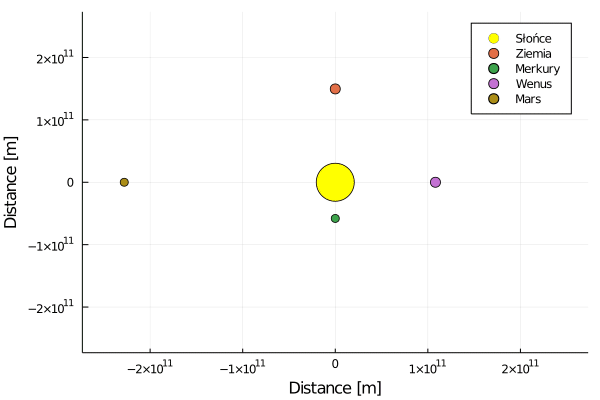

In [52]:
@time Set_coord_list(lista_solar,frames,delta_time,conversion_number)       # ustawia wszystkie listy w atrybutach planet
@time symulation1 = make_symulation1(lista_solar, false)       # symulacja orbitowania planet
gif(symulation1,"animacja1.gif", fps=fps)

# Animacja bezwzględnej prędkości planet układu słonecznego

  0.252951 seconds (2.80 M allocations: 120.544 MiB, 11.70% gc time)
189.769820 seconds (155.88 M allocations: 8.754 GiB, 1.22% gc time)


┌ Info: Saved animation to 
│   fn = C:\Users\Cj\Desktop\Julia\PMprojekt\animacja2.gif
└ @ Plots C:\Users\Cj\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\Cj\\Desktop\\Julia\\PMprojekt\\animacja2.gif")
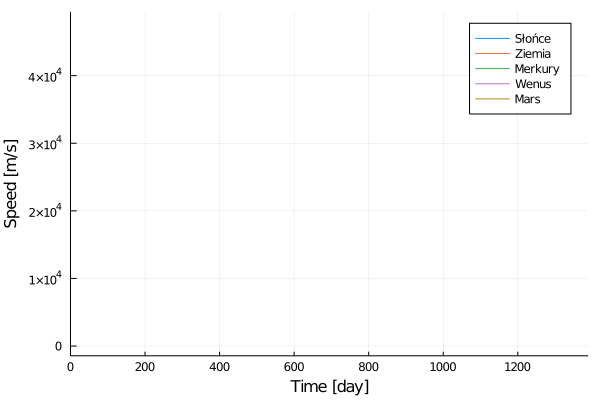

In [57]:
@time Set_coord_list(lista_solar,frames,delta_time,conversion_number)       # ustawia wszystkie listy w atrybutach planet
@time symulation2 = make_symulation2(lista_solar)      # symulacja orbitowania planet
gif(symulation2,"animacja2.gif", fps=fps)

# Animacja bezwzględnego przyspieszenia planet układu słonecznego

  0.260172 seconds (2.80 M allocations: 120.783 MiB, 12.49% gc time)
 42.599758 seconds (37.23 M allocations: 1.638 GiB, 1.14% gc time)


┌ Info: Saved animation to 
│   fn = C:\Users\Cj\Desktop\Julia\PMprojekt\animacja3.gif
└ @ Plots C:\Users\Cj\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\Cj\\Desktop\\Julia\\PMprojekt\\animacja3.gif")
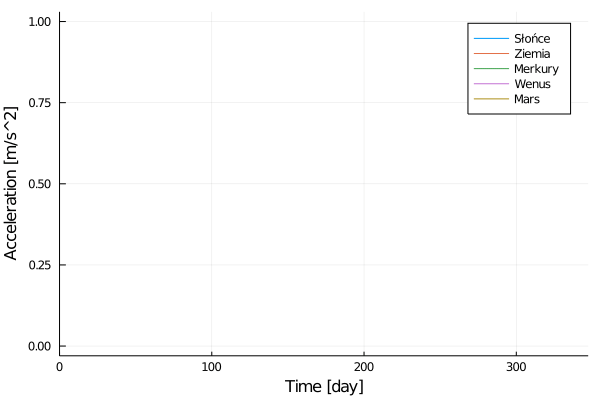

In [78]:
@time Set_coord_list(lista_solar,frames,delta_time,conversion_number)       # ustawia wszystkie listy w atrybutach planet
@time symulation3 = make_symulation3(lista_solar)      # symulacja orbitowania planet
gif(symulation3,"animacja3.gif", fps=fps)

# Animacja układu ROSE

  0.177953 seconds (1.80 M allocations: 79.537 MiB, 20.70% gc time)
 48.447333 seconds (36.32 M allocations: 1.479 GiB, 0.90% gc time)


┌ Info: Saved animation to 
│   fn = C:\Users\Cj\Desktop\Julia\PMprojekt\animacja1.gif
└ @ Plots C:\Users\Cj\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\Cj\\Desktop\\Julia\\PMprojekt\\animacja1.gif")
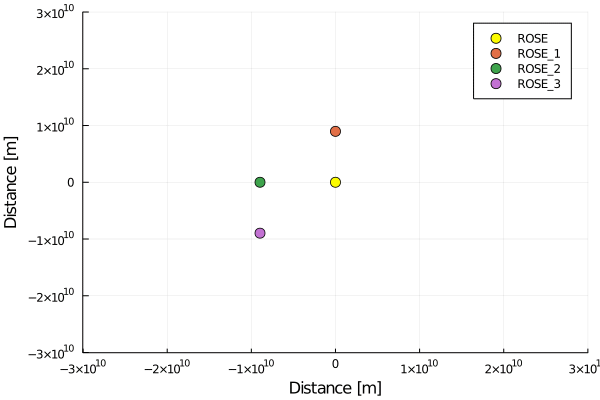

In [77]:
@time Set_coord_list(lista_ROSE,frames,delta_time,conversion_number)       # ustawia wszystkie listy w atrybutach planet
@time symulation1 = make_symulation1(lista_ROSE)      # symulacja orbitowania planet
gif(symulation1,"animacja1.gif", fps=fps)

# Animacja bezwzględnej prędkości planet układu ROSE

  0.241280 seconds (2.70 M allocations: 119.769 MiB, 18.30% gc time)
241.126492 seconds (175.13 M allocations: 9.931 GiB, 1.13% gc time)


┌ Info: Saved animation to 
│   fn = C:\Users\Cj\Desktop\Julia\PMprojekt\animacja1.gif
└ @ Plots C:\Users\Cj\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\Cj\\Desktop\\Julia\\PMprojekt\\animacja1.gif")
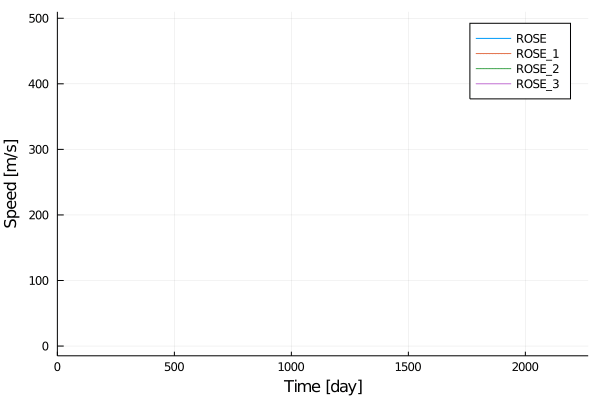

In [62]:
@time Set_coord_list(lista_ROSE,frames,delta_time,conversion_number)       # ustawia wszystkie listy w atrybutach planet
@time symulation2 = make_symulation2(lista_ROSE)      # symulacja orbitowania planet
gif(symulation2,"animacja1.gif", fps=fps)

# Animacja bezwzględnego przyspieszenia planet układu ROSE

  0.168628 seconds (1.80 M allocations: 79.537 MiB, 9.53% gc time)
 40.758597 seconds (35.08 M allocations: 1.507 GiB, 1.02% gc time)


┌ Info: Saved animation to 
│   fn = C:\Users\Cj\Desktop\Julia\PMprojekt\animacja1.gif
└ @ Plots C:\Users\Cj\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\Cj\\Desktop\\Julia\\PMprojekt\\animacja1.gif")
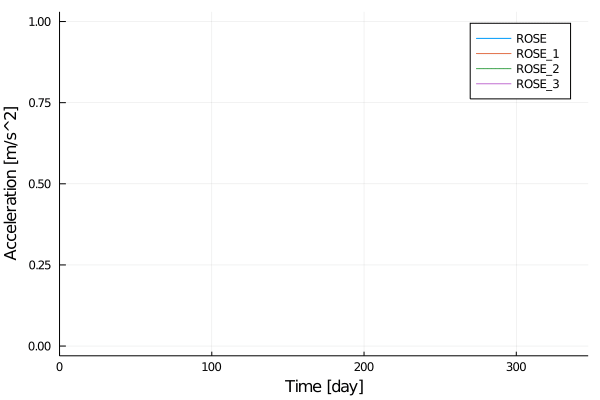

In [69]:
@time Set_coord_list(lista_ROSE,frames,delta_time,conversion_number)       # ustawia wszystkie listy w atrybutach planet
@time symulation3 = make_symulation3(lista_ROSE)      # symulacja orbitowania planet
gif(symulation3,"animacja1.gif", fps=fps)

# Animacja układu OGLE

  0.105653 seconds (1.02 M allocations: 46.974 MiB, 18.30% gc time)
150.041681 seconds (102.48 M allocations: 4.113 GiB, 0.81% gc time)


┌ Info: Saved animation to 
│   fn = C:\Users\Cj\Desktop\Julia\PMprojekt\animacja1.gif
└ @ Plots C:\Users\Cj\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\Cj\\Desktop\\Julia\\PMprojekt\\animacja1.gif")
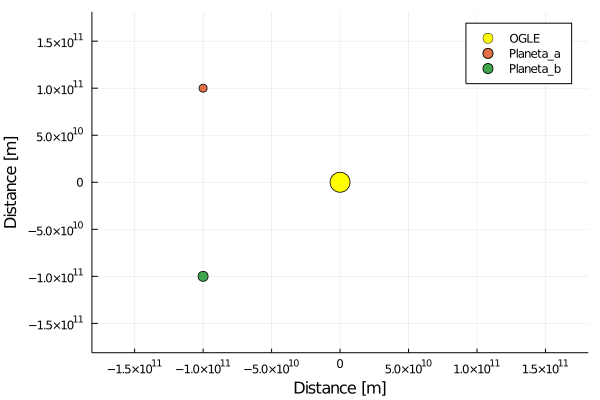

In [70]:
@time Set_coord_list(lista_OGLE,frames,delta_time,conversion_number)       # ustawia wszystkie listy w atrybutach planet
@time symulation1 = make_symulation1(lista_OGLE)      # symulacja orbitowania planet
gif(symulation1,"animacja1.gif", fps=fps)

# Animacja bezwzględnej prędkości planet układu OGLE

  0.102139 seconds (1.02 M allocations: 46.835 MiB, 13.74% gc time)
 40.551971 seconds (32.46 M allocations: 1.357 GiB, 1.04% gc time)


┌ Info: Saved animation to 
│   fn = C:\Users\Cj\Desktop\Julia\PMprojekt\animacja1.gif
└ @ Plots C:\Users\Cj\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\Cj\\Desktop\\Julia\\PMprojekt\\animacja1.gif")
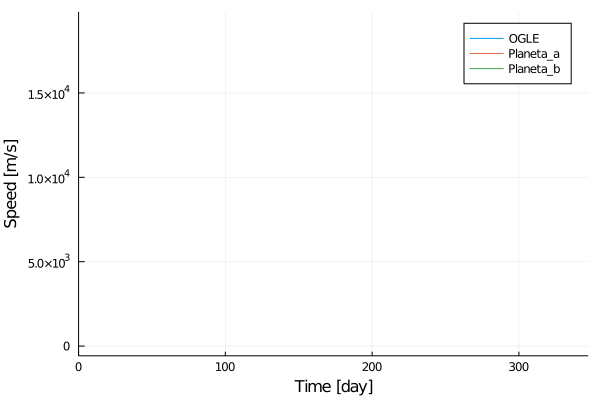

In [76]:
@time Set_coord_list(lista_OGLE,frames,delta_time,conversion_number)       # ustawia wszystkie listy w atrybutach planet
@time symulation2 = make_symulation2(lista_OGLE)      # symulacja orbitowania planet
gif(symulation2,"animacja1.gif", fps=fps)

# Animacja bezwzględnego przyspieszenia planet układu OGLE

  0.106182 seconds (1.02 M allocations: 46.833 MiB, 11.86% gc time)
 83.851535 seconds (66.55 M allocations: 2.996 GiB, 0.98% gc time)


┌ Info: Saved animation to 
│   fn = C:\Users\Cj\Desktop\Julia\PMprojekt\animacja1.gif
└ @ Plots C:\Users\Cj\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\Cj\\Desktop\\Julia\\PMprojekt\\animacja1.gif")
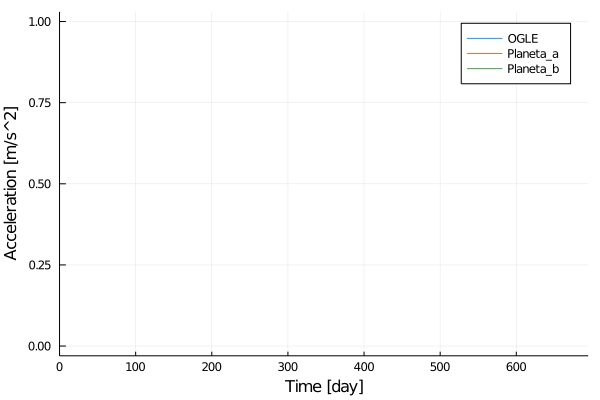

In [68]:
@time Set_coord_list(lista_OGLE,frames,delta_time,conversion_number)       # ustawia wszystkie listy w atrybutach planet
@time symulation3 = make_symulation3(lista_OGLE)      # symulacja orbitowania planet
gif(symulation3,"animacja1.gif", fps=fps)